# Análisis de datos de COVID-19 en el sitio web de CovidTracking



## Objetivos
El objetivo del análisis es aprovechar la información disponible en el conjunto de datos de COVID Tracking para obtener conocimientos y generar insights relevantes que contribuyan a la comprensión de la evolución de la pandemia. A través de un enfoque riguroso y basado en datos, nuestro objetivo es identificar patrones, tendencias y relaciones significativas en los datos, con el fin de proporcionar una visión más completa y precisa del impacto del COVID-19 durante ese periodo.

Mediante la aplicación de técnicas de exploración de datos, visualización y análisis estadístico, buscamos descubrir y comunicar información relevante que pueda contribuir a la generación de conocimiento y a la difusión de información precisa y confiable sobre la pandemia pasada. Pretendemos presentar los resultados de una manera accesible y comprensible, utilizando visualizaciones claras y resaltando los aspectos clave que emergen de los datos históricos.

Este proyecto tiene como objetivo fortalecer nuestras habilidades en el análisis de datos y la visualización, así como demostrar nuestra capacidad para utilizar herramientas y técnicas adecuadas para obtener resultados sólidos y confiables. Nuestro objetivo final es presentar un informe completo y bien estructurado que documente los hallazgos, conclusiones y recomendaciones derivadas del análisis de datos históricos de la pandemia de COVID-19.

Al finalizar, este informe servirá como una fuente valiosa de información para diferentes audiencias, incluyendo investigadores, académicos y el público en general interesado en comprender la evolución pasada de la pandemia. A través de este proyecto, esperamos contribuir al conocimiento acumulado sobre la COVID-19 y fomentar una mentalidad basada en datos para la toma de decisiones en futuras situaciones similares.


## Importación de librerías

En esta sección, se realizará la importación de las librerías necesarias para el análisis de datos en Python. Estas librerías, como Pandas, NumPy, Matplotlib y Seaborn, nos brindarán las herramientas esenciales para manipular, visualizar y analizar los datos de manera efectiva.

In [2]:
import requests
from datetime import datetime

# Librerías estándar de análisis de datos
import pandas as pd
import numpy as np

# Librerías de visualización
import seaborn as sns
import matplotlib.pyplot as plt
from bokeh.plotting import figure, show
from bokeh.io import output_notebook
from bokeh.models import ColumnDataSource, HoverTool
from bokeh.layouts import gridplot

## Importación de datos

En esta sección, se procederá a importar los datos necesarios para el análisis del proyecto. Se utilizará la función de lectura de datos de Pandas para cargar el conjunto de datos desde https://covidtracking.com/. A partir de aquí, se explorará y analizará la estructura de los datos para poder realizar las transformaciones y manipulaciones necesarias.

In [3]:
urldata = "https://api.covidtracking.com/v1/states/daily.csv"

def loaddata(url):
    try:
        df_api = pd.read_csv(url)
        return df_api
    except Exception as e:
        print(f"Error al obtener datos de {url}: {e}")
        return None

df_api = loaddata(urldata)

if df_api is not None:
    print("Datos cargados con exito")
else:
    print("Datos no cargados")


Datos cargados con exito


## Informacion de las columnas originales del dataframe

In [4]:
df_api.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20780 entries, 0 to 20779
Data columns (total 56 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   date                         20780 non-null  int64  
 1   state                        20780 non-null  object 
 2   positive                     20592 non-null  float64
 3   probableCases                9271 non-null   float64
 4   negative                     13290 non-null  float64
 5   pending                      2138 non-null   float64
 6   totalTestResultsSource       20780 non-null  object 
 7   totalTestResults             20614 non-null  float64
 8   hospitalizedCurrently        17339 non-null  float64
 9   hospitalizedCumulative       12382 non-null  float64
 10  inIcuCurrently               11636 non-null  float64
 11  inIcuCumulative              3789 non-null   float64
 12  onVentilatorCurrently        9126 non-null   float64
 13  onVentilatorCumu

## Modificamos el campo date para poder usarlo como fecha

In [5]:
'''df_api['date'] = pd.to_datetime(df_api['date'], format='%Y%m%d')
print(df_api['date'].dtype)'''

"df_api['date'] = pd.to_datetime(df_api['date'], format='%Y%m%d')\nprint(df_api['date'].dtype)"

#Guardar archivo excel para su exploración

In [6]:
df_api.to_excel('dataframe.xlsx', index=False)

ModuleNotFoundError: No module named 'openpyxl'

## Chequeamos valores null para cada columna

In [7]:
valores_nulos_por_columna = df_api.isnull().sum()
print(valores_nulos_por_columna)

date                               0
state                              0
positive                         188
probableCases                  11509
negative                        7490
pending                        18642
totalTestResultsSource             0
totalTestResults                 166
hospitalizedCurrently           3441
hospitalizedCumulative          8398
inIcuCurrently                  9144
inIcuCumulative                16991
onVentilatorCurrently          11654
onVentilatorCumulative         19490
recovered                       8777
lastUpdateEt                     616
dateModified                     616
checkTimeEt                      616
death                            850
hospitalized                    8398
hospitalizedDischarged         17710
dateChecked                      616
totalTestsViral                 6264
positiveTestsViral             11822
negativeTestsViral             15756
positiveCasesViral              6534
deathConfirmed                 11358
d

## Chequeamos el porcentaje de valores null para cada columna

In [8]:
porcentaje_nulos = df_api.isnull().mean() * 100
print(porcentaje_nulos)

date                             0.000000
state                            0.000000
positive                         0.904716
probableCases                   55.384986
negative                        36.044273
pending                         89.711261
totalTestResultsSource           0.000000
totalTestResults                 0.798845
hospitalizedCurrently           16.559192
hospitalizedCumulative          40.413859
inIcuCurrently                  44.003850
inIcuCumulative                 81.766121
onVentilatorCurrently           56.082772
onVentilatorCumulative          93.792108
recovered                       42.237729
lastUpdateEt                     2.964389
dateModified                     2.964389
checkTimeEt                      2.964389
death                            4.090472
hospitalized                    40.413859
hospitalizedDischarged          85.226179
dateChecked                      2.964389
totalTestsViral                 30.144370
positiveTestsViral              56

Notamos que existen varias columnas cuyo proporción de valores nulos impide que podamos considerarlas para el análisis.
Decidimos eliminar todas las columnas que tienen más de 80% de sus valores nulos.

In [9]:
# Calcula el porcentaje de valores nulos en cada columna
null_percentages = df_api.isnull().sum() / len(df_api)

# Filtra las columnas que tienen más del 80% de valores nulos
columns_to_drop = null_percentages[null_percentages > 0.8].index

# Crea un nuevo dataset sin las columnas filtradas
new_df = df_api.drop(columns=columns_to_drop)

# Calcula el porcentaje de valores nulos en cada columna
null_percentages = df_api.isnull().sum() / len(df_api)

# Filtra las columnas que tienen entre el 50% y el 19% de valores nulos
columns_to_check = null_percentages[(null_percentages < 0.79) & (null_percentages > 0.5)].index

# Imprime las columnas que cumplen la condición
print("Columnas con entre 50% y 79% de valores nulos:")
for column in columns_to_check:
    print(column)
    
    
    # Imprimir el resultado
print("\nPorcentaje de valores nulos por columna:")
print(porcentaje_nulos)



Columnas con entre 50% y 79% de valores nulos:
probableCases
onVentilatorCurrently
positiveTestsViral
negativeTestsViral
deathConfirmed
deathProbable
totalTestEncountersViral
totalTestsPeopleViral
totalTestsAntibody

Porcentaje de valores nulos por columna:
date                             0.000000
state                            0.000000
positive                         0.904716
probableCases                   55.384986
negative                        36.044273
pending                         89.711261
totalTestResultsSource           0.000000
totalTestResults                 0.798845
hospitalizedCurrently           16.559192
hospitalizedCumulative          40.413859
inIcuCurrently                  44.003850
inIcuCumulative                 81.766121
onVentilatorCurrently           56.082772
onVentilatorCumulative          93.792108
recovered                       42.237729
lastUpdateEt                     2.964389
dateModified                     2.964389
checkTimeEt                 

Analizamos con detenimiento las columnas en las que la proporción de nulos va del 50% al 79%, decidimos eliminar algunas de ellas.
Asimismo, eliminamos también las columnas que según nos indican en la documentación del propio dataframe, están obsoletas.

In [11]:
# Lista de columnas a eliminar
columnas_a_eliminar = ['probableCases', 'positiveTestsViral','negativeTestsViral',
                       'totalTestEncountersViral', 'totalTestsPeopleViral', 'totalTestsAntibody',
                      'fips', 'positiveIncrease', 'negativeIncrease', 'total', 'totalTestResultsIncrease', 
                       'posNeg', 'deathIncrease', 'hospitalizedIncrease', 'hash', 'commercialScore', 
                       'negativeRegularScore', 'negativeScore', 'positiveScore', 'score', 'fips',
                       'positiveIncrease','totalTestResultsIncrease','deathIncrease','hospitalizedIncrease',
                       'negativeRegularScore','negativeScore','totalTestResults', 'hospitalizedCumulative']

# Crear un nuevo DataFrame excluyendo las columnas especificadas
df = new_df.drop(columns=columnas_a_eliminar)

# Imprimir el nuevo DataFrame
print(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20780 entries, 0 to 20779
Data columns (total 19 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   date                    20780 non-null  int64  
 1   state                   20780 non-null  object 
 2   positive                20592 non-null  float64
 3   negative                13290 non-null  float64
 4   totalTestResultsSource  20780 non-null  object 
 5   hospitalizedCurrently   17339 non-null  float64
 6   inIcuCurrently          11636 non-null  float64
 7   onVentilatorCurrently   9126 non-null   float64
 8   recovered               12003 non-null  float64
 9   lastUpdateEt            20164 non-null  object 
 10  dateModified            20164 non-null  object 
 11  checkTimeEt             20164 non-null  object 
 12  death                   19930 non-null  float64
 13  hospitalized            12382 non-null  float64
 14  dateChecked             20164 non-null

## Cargamos los nombre de los estados en el dataframe

In [12]:
cantidad_estados = df_api['state'].nunique()

print("Cantidad de estados diferentes:", cantidad_estados)

Cantidad de estados diferentes: 56


In [14]:
state_codes = {
    'AK': 'Alaska',
    'AL': 'Alabama',
    'AR': 'Arkansas',
    'AS': 'American Samoa',
    'AZ': 'Arizona',
    'CA': 'California',
    'CO': 'Colorado',
    'CT': 'Connecticut',
    'DC': 'District of Columbia',
    'DE': 'Delaware',
    'FL': 'Florida',
    'GA': 'Georgia',
    'GU': 'Guam',
    'HI': 'Hawaii',
    'IA': 'Iowa',
    'ID': 'Idaho',
    'IL': 'Illinois',
    'IN': 'Indiana',
    'KS': 'Kansas',
    'KY': 'Kentucky',
    'LA': 'Louisiana',
    'MA': 'Massachusetts',
    'MD': 'Maryland',
    'ME': 'Maine',
    'MI': 'Michigan',
    'MN': 'Minnesota',
    'MO': 'Missouri',
    'MP': 'Northern Mariana Islands',
    'MS': 'Mississippi',
    'MT': 'Montana',
    'NC': 'North Carolina',
    'ND': 'North Dakota',
    'NE': 'Nebraska',
    'NH': 'New Hampshire',
    'NJ': 'New Jersey',
    'NM': 'New Mexico',
    'NV': 'Nevada',
    'NY': 'New York',
    'OH': 'Ohio',
    'OK': 'Oklahoma',
    'OR': 'Oregon',
    'PA': 'Pennsylvania',
    'PR': 'Puerto Rico',
    'RI': 'Rhode Island',
    'SC': 'South Carolina',
    'SD': 'South Dakota',
    'TN': 'Tennessee',
    'TX': 'Texas',
    'UT': 'Utah',
    'VA': 'Virginia',
    'VI': 'Virgin Islands',
    'VT': 'Vermont',
    'WA': 'Washington',
    'WI': 'Wisconsin',
    'WV': 'West Virginia',
    'WY': 'Wyoming'
}
df['state'] = df['state'].map(state_codes)


#identificamos que a pesar de existir 50 estados en USA, nuestro dataset cuenta con 56 valores en la columna estados. Tras analizar, encontramos que se incluyen en esta lista 6 territorios no catalogados como estados oficiales.

# Análisis de la informacion


### Un viaje a través del tiempo: cómo la pandemia impactó a los Estados Unidos

La pandemia de COVID-19 ha tenido un impacto profundo en los Estados Unidos. En este artículo, analizaremos los datos oficiales recopilados día a día en cada estado, para explorar cómo la propagación del virus ha afectado de manera única y dinámica a diferentes regiones del país.

## Los primeros casos
Los primeros casos de COVID-19 en los Estados Unidos se registraron en enero y febrero de 2020. Los casos se concentraron inicialmente en estados con  una gran población y densidad de ciudades importantes, lo que contribuyó a la rápida propagación del virus en las primeras etapas. 

Podemos comprobar esta informacion en la siguiente tabla que nos muestra la fecha del primer caso en cada estado

In [15]:
from tabulate import tabulate
from IPython.display import HTML

# Ordenar el dataframe por fecha
df_sorted = df.sort_values(by=['date'])

# Filtrar solo los primeros casos de cada estado
first_cases = df_sorted.drop_duplicates(subset='state', keep='first')

# Calcular el número de columnas necesarias
num_columns = int(np.ceil(len(first_cases) / 10))

# Dividir el DataFrame en trozos más pequeños
split_dfs = np.array_split(first_cases, num_columns)

# Crear una lista de tablas en formato HTML para cada columna
tables = [tabulate(df[['state', 'date']], headers='keys', tablefmt='html', showindex=False) for df in split_dfs]

# Crear el código HTML para mostrar las tablas en columnas
html_code = "<div style='display: flex;'>"
for table in tables:
    html_code += f"<div style='flex: 1; margin-right: 20px;'>{table}</div>"
html_code += "</div>"

# Mostrar las tablas en columnas utilizando HTML
display(HTML(html_code))



ModuleNotFoundError: No module named 'tabulate'

## Tendencia de casos positivos con el tiempo
A medida que la pandemia avanzaba, se pudo notar una curva exponencial en el número de casos positivos, lo que indicaba una rápida y sostenida propagación del virus. Los estados informaban aumentos diarios significativos en los casos confirmados, y la situación evolucionaba rápidamente.

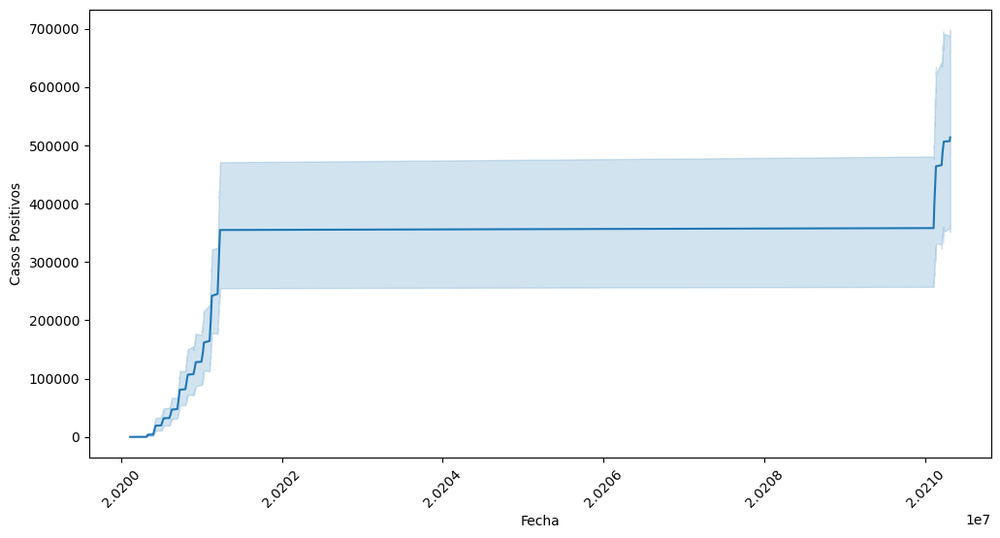

In [16]:
plt.figure(figsize=(12, 6))
sns.lineplot(x='date', y='positive', data=df)
plt.title('')
plt.xlabel('Fecha')
plt.ylabel('Casos Positivos')
plt.xticks(rotation=45)
plt.show()

## Casos Positivos de COVID-19 por Estado

Al observar los datos, es evidente que algunos estados fueron afectados más gravemente que otros, con mayores números de casos positivos y brotes más extensos. Estados como California, Texas y Florida emergieron como puntos críticos de la pandemia debido a su alta población, centros urbanos densamente poblados y flujos de viaje internacionales.

El análisis de los casos positivos por estado ha sido fundamental para informar la toma de decisiones a nivel local, estatal y federal, permitiendo identificar áreas de mayor riesgo y dirigir los recursos de manera más eficiente para controlar la propagación del virus y proteger la salud pública.

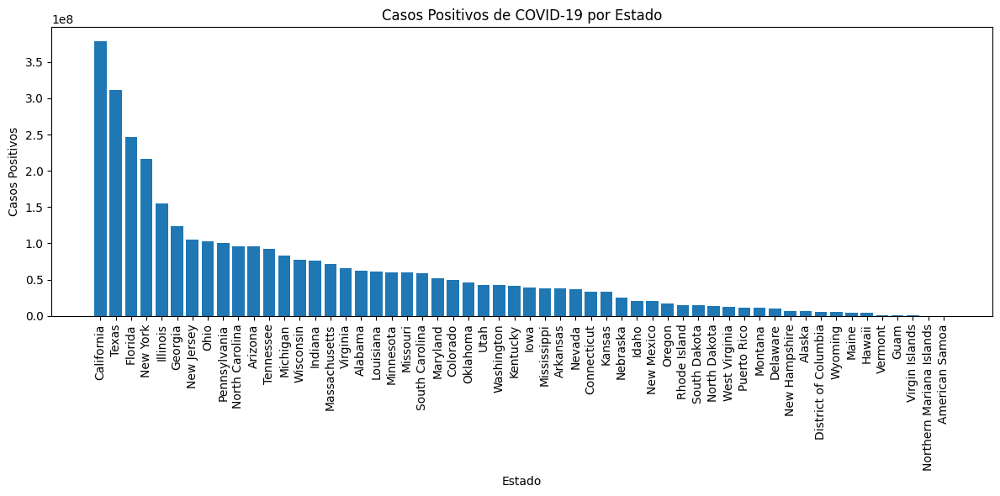

In [17]:
df_casos_por_estado = df[['state', 'positive']]

# Agrupar los datos por estado y sumar los casos positivos
casos_por_estado = df_casos_por_estado.groupby('state')['positive'].sum()

# Ordenar los estados por la cantidad de casos positivos de forma descendente
casos_por_estado = casos_por_estado.sort_values(ascending=False)

# Graficar los casos por estado
plt.figure(figsize=(12, 6))
plt.bar(casos_por_estado.index, casos_por_estado.values)
plt.xlabel('Estado')
plt.ylabel('Casos Positivos')
plt.title('Casos Positivos de COVID-19 por Estado')
plt.xticks(rotation=90)  # Rotar los nombres de los estados para que sean legibles
plt.tight_layout()
plt.show()

## Evolución de casos detallada por estado 

Al examinar las gráficas, podemos observar cómo algunos estados experimentaron picos agudos en los casos diarios, reflejando momentos críticos en los que la transmisión del virus fue más intensa. Estos picos podrían estar asociados con eventos específicos, como brotes en instalaciones de cuidado de la salud, reuniones masivas o la relajación temporal de las medidas de distanciamiento social.

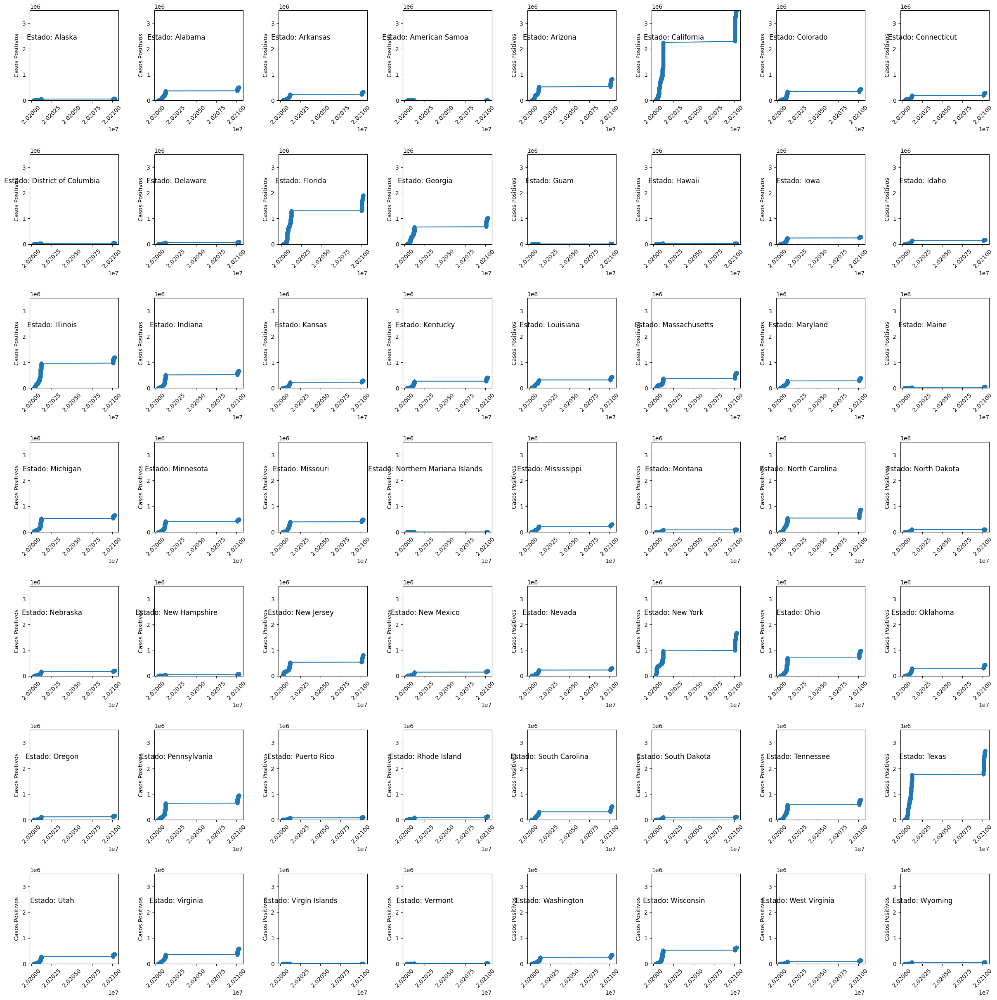

In [18]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

# Obtener la lista de estados únicos presentes en el DataFrame
estados = df['state'].unique()

# Definir el tamaño de la cuadrícula de subplots
filas = 7  # Puedes ajustar el número de filas según la cantidad de estados únicos
columnas = 8  # Puedes ajustar el número de columnas según la cantidad de estados únicos

# Crear una figura con el tamaño adecuado para contener la cuadrícula de subplots
plt.figure(figsize=(30, 30))

# Utilizar gridspec para crear una cuadrícula personalizada de subplots
grid = gridspec.GridSpec(filas, columnas, wspace=0.4, hspace=0.6)

# Establecer los límites del eje Y
ylim_min = df['positive'].min()
ylim_max = df['positive'].max()

# Iterar sobre los estados y generar un gráfico de líneas para cada uno
for i, estado in enumerate(estados):
    # Filtrar los datos para el estado actual
    data_estado = df[df['state'] == estado]
    
    # Ordenar los datos por fecha en orden ascendente
    data_estado = data_estado.sort_values(by='date')
    
    # Crear el subplot en la posición correspondiente en la cuadrícula
    ax = plt.subplot(grid[i])
    
    # Crear el gráfico de líneas para el estado actual
    ax.plot(data_estado['date'], data_estado['positive'], marker='o', linestyle='-')
    
    # Establecer los límites del eje Y para todos los gráficos
    ax.set_ylim(ylim_min, ylim_max)
    
    # Configurar el título del gráfico con el nombre del estado
    # ax.set_title(f'Estado: {estado}', pad=10)  # Ajustar el valor de pad para mover el título dentro del gráfico
    
    # Agregar etiqueta dentro del gráfico
    ax.text(0.25, 0.7, f'Estado: {estado}', transform=ax.transAxes, fontsize=12, ha='center', va='center')
    # Puedes ajustar los valores (0.5, 0.5) para cambiar la posición de la etiqueta dentro del gráfico
    
    # Configurar las etiquetas de los ejes
    ax.set_ylabel('Casos Positivos')
    
    # Rotar las etiquetas del eje x para una mejor visualización
    plt.setp(ax.get_xticklabels(), rotation=45)

# Mostrar la cuadrícula de subplots
# plt.tight_layout()  # Ajustar el diseño de la figura automáticamente
plt.show()

## Identificamos la gráfica de American Samoa
Es una recta en 0, la exploramos más detalladamente y encontramos que si bien existen
357 registros para el estado American Samoa, estos se encuentran vacíos.



In [19]:
state_AS = df.loc[df['state'] == 'American Samoa']
print(state_AS)
print(len(state_AS))
cantidad_valores_distintos = state_AS['positive'].nunique()
print (cantidad_valores_distintos)

           date           state  positive  negative totalTestResultsSource  \
3      20210307  American Samoa       0.0    2140.0        totalTestsViral   
59     20210306  American Samoa       0.0    2140.0        totalTestsViral   
115    20210305  American Samoa       0.0    2140.0        totalTestsViral   
171    20210304  American Samoa       0.0    2140.0        totalTestsViral   
227    20210303  American Samoa       0.0    2140.0        totalTestsViral   
...         ...             ...       ...       ...                    ...   
19715  20200320  American Samoa       NaN       NaN        totalTestsViral   
19771  20200319  American Samoa       NaN       NaN        totalTestsViral   
19827  20200318  American Samoa       NaN       NaN        totalTestsViral   
19883  20200317  American Samoa       NaN       NaN        totalTestsViral   
19939  20200316  American Samoa       NaN       NaN        totalTestsViral   

       hospitalizedCurrently  inIcuCurrently  onVentilatorCurre

In [21]:
df = df.sort_values(by=['state', 'date'])
# Definimos una función para calcular los casos confirmados diarios

df['date'] = pd.to_datetime(df['date'], format='%Y%m%d')


def calcular_casos_diarios(group):
    group['casos_confirmados_diarios_por_estado'] = group['positive'].diff()
    return group

# Agrupa los datos por estado y aplica la función para calcular los casos diarios

grouped_df = df.groupby('state').apply(calcular_casos_diarios)


# Restablecer el índice para evitar ambigüedad
grouped_df.reset_index(drop=True, inplace=True)

grouped_df
# Crear gráficas interactivas para cada estado utilizando Bokeh
output_notebook()

# Lista de estados
estados = grouped_df['state'].unique()


figuras = []

for estado in estados:
    data_estado = grouped_df[grouped_df['state'] == estado]
    
    source = ColumnDataSource(data=data_estado)
    
    p = figure(title=f'Evolución de Casos Confirmados Diarios en {estado}',
               x_axis_label='Fecha',
               y_axis_label='Casos Confirmados Diarios',
               x_axis_type='datetime',
               width=800,  # Utiliza width en lugar de plot_width
               height=400)  # Utiliza height en lugar de plot_height
    p.line('date', 'casos_confirmados_diarios_por_estado', source=source, line_width=2)
    # Añadir interacción de "hover" para mostrar detalles al pasar el cursor por encima de la línea
    hover = HoverTool()
    hover.tooltips = [('Fecha', '@date{%F}'), ('Casos Diarios', '@casos_confirmados_diarios_por_estado')]
    hover.formatters = {'@date': 'datetime'}
    p.add_tools(hover)
    figuras.append(p)
# Organizar las gráficas en un grid layout
grid_layout = gridplot([figuras], toolbar_location='above')

#  Mostrar las gráficas
show(grid_layout)

Loading BokehJS ...

## Relación de casos positivos por muertes 

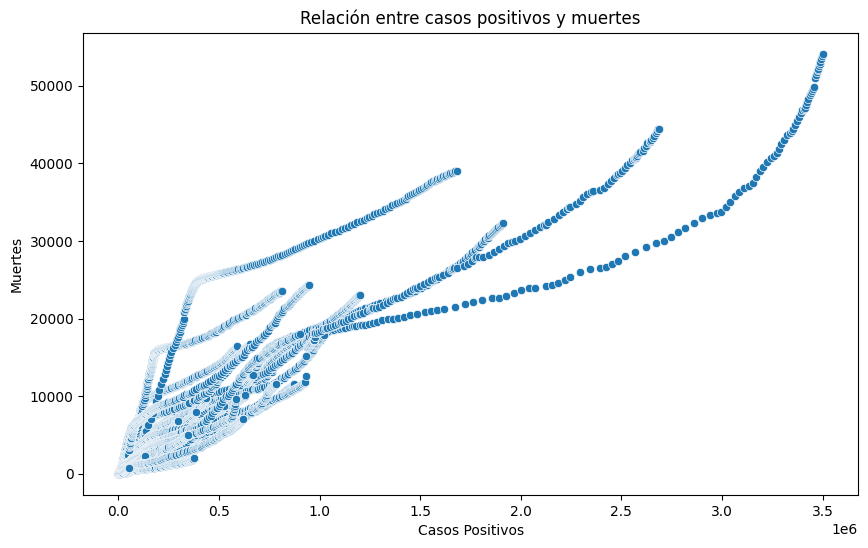

In [93]:
# Relación entre casos positivos y muertes
plt.figure(figsize=(10, 6))
sns.scatterplot(x='positive', y='death', data=df)
plt.title('Relación entre casos positivos y muertes')
plt.xlabel('Casos Positivos')
plt.ylabel('Muertes')
plt.show()


In [22]:
# Definimos una función para calcular las muertes diarias por estado
def calcular_muertes_diarias(group):
    group['muertes_diarias_por_estado'] = group['death'].diff()
    return group

# Agrupa los datos por estado y aplica la función para calcular las muertes diarias
grouped_df = df.groupby('state').apply(calcular_muertes_diarias)

# Restablecer el índice para evitar ambigüedad
grouped_df.reset_index(drop=True, inplace=True)

# Mostrar el DataFrame con las muertes diarias por estado
print(grouped_df[['state', 'date', 'muertes_diarias_por_estado']])



output_notebook()

# Lista de estados
estados = grouped_df['state'].unique()

figuras = []

for estado in estados:
    data_estado = grouped_df[grouped_df['state'] == estado]
    
    source = ColumnDataSource(data=data_estado)
    
    p = figure(title=f'Evolución de Muertes Diarias en {estado}',
               x_axis_label='Fecha',
               y_axis_label='Muertes Diarias',
               x_axis_type='datetime',
               width=800,
               height=400)
    
    p.line('date', 'muertes_diarias_por_estado', color='red', source=source, line_width=2)
    
    # Añadir interacción de "hover" para mostrar detalles al pasar el cursor por encima de la línea
    hover = HoverTool()
    hover.tooltips = [('Fecha', '@date{%F}'), ('Muertes Diarias', '@muertes_diarias_por_estado')]
    hover.formatters = {'@date': 'datetime'}
    p.add_tools(hover)
    
    figuras.append(p)

# Organizar las gráficas en un grid layout
grid_layout = gridplot([figuras], toolbar_location='above')

# Mostrar las gráficas
show(grid_layout)

         state       date  muertes_diarias_por_estado
0      Alabama 2020-03-07                         NaN
1      Alabama 2020-03-08                         NaN
2      Alabama 2020-03-09                         NaN
3      Alabama 2020-03-10                         NaN
4      Alabama 2020-03-11                         NaN
...        ...        ...                         ...
20775  Wyoming 2021-03-03                         0.0
20776  Wyoming 2021-03-04                         0.0
20777  Wyoming 2021-03-05                         0.0
20778  Wyoming 2021-03-06                         0.0
20779  Wyoming 2021-03-07                         0.0

[20780 rows x 3 columns]


Loading BokehJS ...

#Heatmap de correlación entre variables

Este gráfico nos permite observar la relación entre variables, los valores de correlación van de -1 a 1.
1 indica una correlación positiva perfecta: cuando una variable aumenta, la otra también
0 indica que no hay correlación entre variables
-1 indica una correlación negativa perfecta: cuando una variable aumenta, la otra disminuye.

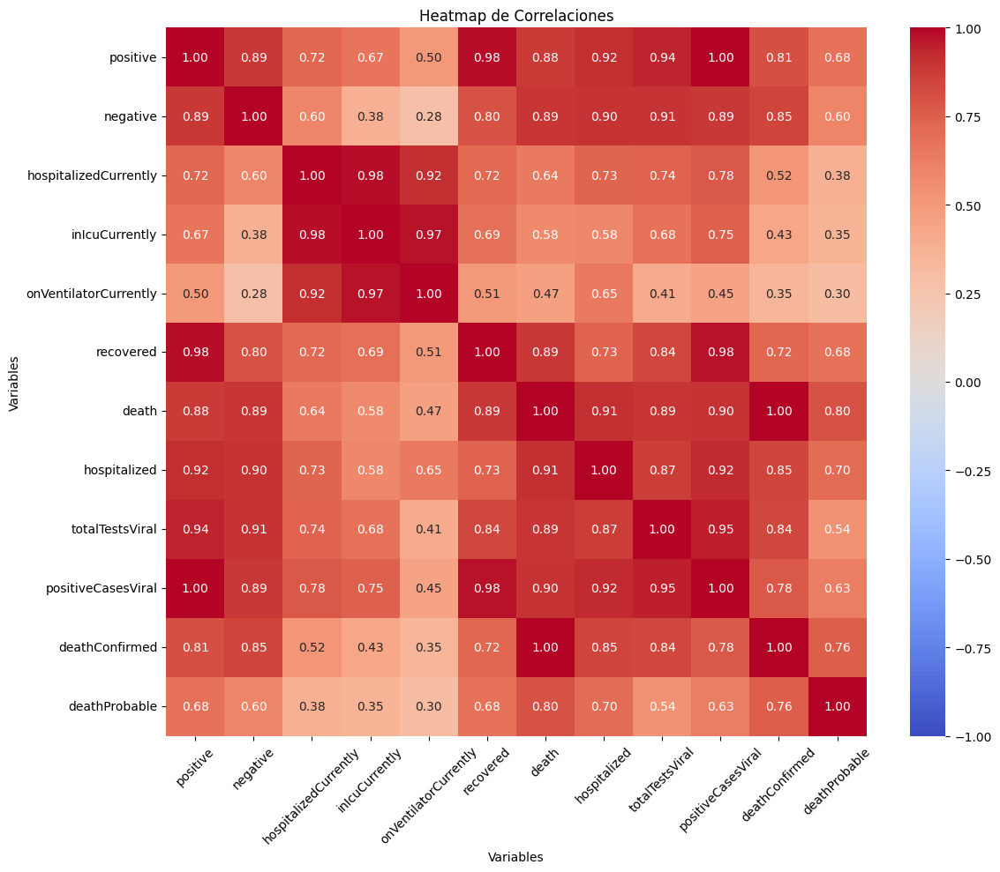

In [23]:
# Filtrar las columnas numéricas

df_numeric = df.select_dtypes(include=['float64', 'int64'])

# Obtener la matriz de correlaciones
correlation_matrix = df_numeric.corr()





# Crear el heatmap de correlaciones
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, cmap='coolwarm', annot=True, fmt='.2f', vmin=-1, vmax=1)
plt.title('Heatmap de Correlaciones')
plt.xlabel('Variables')
plt.ylabel('Variables')
plt.xticks(rotation=45)
plt.tight_layout()

# Mostrar el heatmap
plt.show()


#Relación con el Riesgo de Pobreza
    

Cuando analizamos el número total de infectados y muertos por estado, observamos una gran diferencia entre ellos, lo que nos llamó la atención y despertó nuestra curiosidad por intentar comprender el motivo de tales discrepancias.

Nuestra primera idea fue que la realidad social de cada estado podría explicar el hecho. Luego nos preguntamos qué marcadores macroeconómicos podrían utilizarse para este estudio.

Descartamos inmediatamente el uso del PIB (Producto Interior Bruto), pues sabemos hasta qué punto este índice puede enmascarar las desigualdades sociales. Hay varios países, como Brasil, que están entre las 10 mayores economías del mundo, pero tienen una elevada concentración de la renta y muchas personas que viven por debajo del umbral de la pobreza.

Entonces pensamos en utilizar el IDH (Índice de Desarrollo Humano) de los estados, pero nos dimos cuenta de que la diferencia entre los estados es muy pequeña y no podía justificar la disparidad en cuestión.

Además, lo más probable es que el IDH de una zona muy extensa, como un estado, no refleje las condiciones de vida de las familias menos favorecidas. 

 Consideramos que el índice más representativo para realizar este análisis sería el riesgo de pobreza, que es un término utilizado para describir la situación en la que una persona o grupo de personas se encuentra en una posición económica vulnerable, con un alto riesgo de caer por debajo del umbral de la pobreza. En general, se refiere a la probabilidad de que una persona tenga unos ingresos bajos o insuficientes para cubrir necesidades básicas como la alimentación, la vivienda, la sanidad y la educación.

El riesgo de pobreza puede variar según el país, la región o incluso dentro de una misma comunidad. Factores como el desempleo, la falta de acceso a los servicios públicos, la falta de educación y la discriminación pueden contribuir a aumentar el riesgo de pobreza.

Las medidas del riesgo de pobreza suelen basarse en indicadores económicos como los ingresos familiares o la tasa de pobreza relativa. También pueden tener en cuenta factores adicionales como el tamaño de la familia, la composición del hogar y las prestaciones sociales disponibles.

Abordar el riesgo de pobreza es importante para una sociedad más justa e igualitaria, proporcionando oportunidades y recursos a las personas en situación económica precaria para ayudarles a superar la pobreza y mejorar sus condiciones de vida.

In [24]:
# URL de la API en formato CSV
HISTORIC_ALL_STATES = "https://api.covidtracking.com/v1/states/daily.csv"

def obtener_datos_csv(url):
    try:
        df = pd.read_csv(url)
        return df
    except Exception as e:
        print(f"Error al obtener datos de {url}: {e}")
        return None

# Obtener datos en formato CSV
df = obtener_datos_csv(HISTORIC_ALL_STATES)

# Imprimir los primeros registros de los datos
if df is not None:
    print("Primeros registros de los datos:")
    print(df.head())
else:
    print("No se pudieron obtener los datos")


Primeros registros de los datos:
       date state  positive  probableCases   negative  pending  \
0  20210307    AK   56886.0            NaN        NaN      NaN   
1  20210307    AL  499819.0       107742.0  1931711.0      NaN   
2  20210307    AR  324818.0        69092.0  2480716.0      NaN   
3  20210307    AS       0.0            NaN     2140.0      NaN   
4  20210307    AZ  826454.0        56519.0  3073010.0      NaN   

  totalTestResultsSource  totalTestResults  hospitalizedCurrently  \
0        totalTestsViral         1731628.0                   33.0   
1  totalTestsPeopleViral         2323788.0                  494.0   
2        totalTestsViral         2736442.0                  335.0   
3        totalTestsViral            2140.0                    NaN   
4        totalTestsViral         7908105.0                  963.0   

   hospitalizedCumulative  ...  dataQualityGrade  deathIncrease  \
0                  1293.0  ...               NaN              0   
1                 459

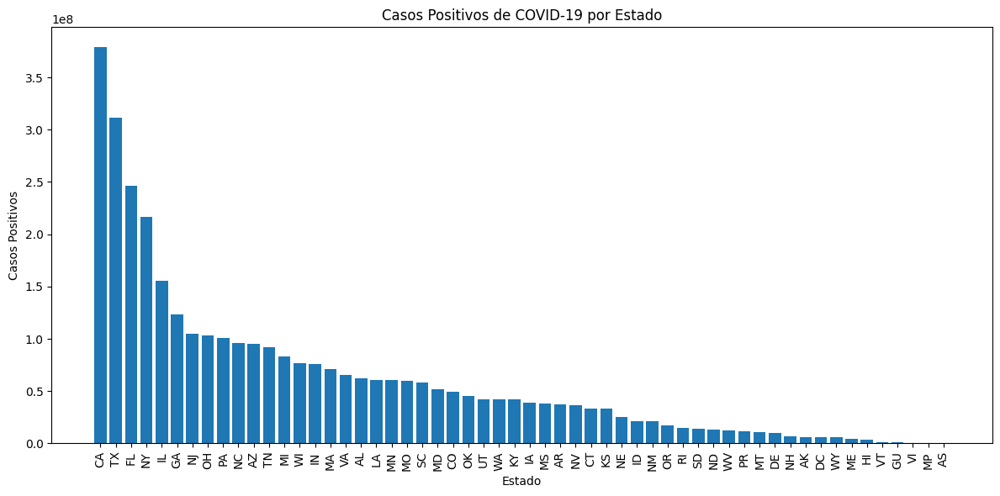

In [25]:
df_casos_por_estado = df[['state', 'positive']]

# Agrupar los datos por estado y sumar los casos positivos
casos_por_estado = df_casos_por_estado.groupby('state')['positive'].sum()

# Ordenar los estados por la cantidad de casos positivos de forma descendente
casos_por_estado = casos_por_estado.sort_values(ascending=False)

# Graficar los casos por estado
plt.figure(figsize=(12, 6))
plt.bar(casos_por_estado.index, casos_por_estado.values)
plt.xlabel('Estado')
plt.ylabel('Casos Positivos')
plt.title('Casos Positivos de COVID-19 por Estado')
plt.xticks(rotation=90)  # Rotar los nombres de los estados para que sean legibles
plt.tight_layout()
plt.show()

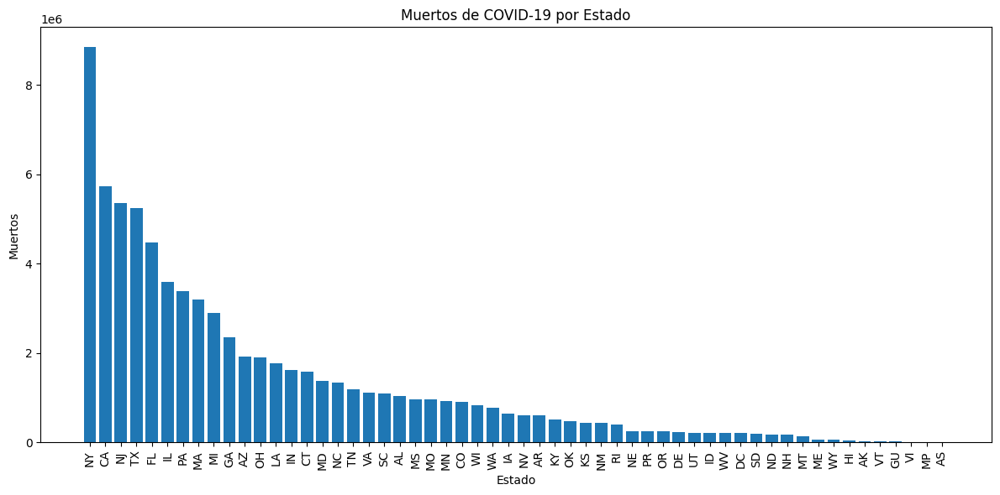

In [26]:
df_casos_por_estado = df[['state', 'death']]

# Agrupar los datos por estado y sumar los casos positivos
casos_por_estado = df_casos_por_estado.groupby('state')['death'].sum()

# Ordenar los estados por la cantidad de casos positivos de forma descendente
casos_por_estado = casos_por_estado.sort_values(ascending=False)

# Graficar los casos por estado
plt.figure(figsize=(12, 6))
plt.bar(casos_por_estado.index, casos_por_estado.values)
plt.xlabel('Estado')
plt.ylabel('Muertos')
plt.title('Muertos de COVID-19 por Estado')
plt.xticks(rotation=90)  # Rotar los nombres de los estados para que sean legibles
plt.tight_layout()
plt.show()

In [33]:
#importar tabla sobre riesgo de pobreza
ruta_archivo= "D:\\tableB-5.xlsx"
dfrp = pd.read_excel(ruta_archivo, skiprows=5)
dfrp = dfrp.drop([0, 52, 53, 54, 55], axis=0)
print(dfrp)

              Unnamed: 0  Estimate  Margin of error1 (±)  Estimate.1  \
1                Alabama     726.0                  90.0        14.6   
2                 Alaska      83.0                  10.0        11.7   
3                Arizona     806.0                  92.0        11.2   
4               Arkansas     447.0                  41.0        15.1   
5             California    4323.0                 205.0        11.0   
6               Colorado     511.0                 104.0         8.9   
7            Connecticut     325.0                  46.0         9.2   
8               Delaware      95.0                  13.0         9.6   
9   District of Columbia      97.0                   8.0        14.5   
10               Florida    2688.0                 186.0        12.5   
11               Georgia    1383.0                 174.0        13.1   
12                Hawaii     144.0                  19.0        10.1   
13                 Idaho     158.0                  16.0        

In [34]:
print(dfrp.info())

<class 'pandas.core.frame.DataFrame'>
Index: 51 entries, 1 to 51
Data columns (total 11 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Unnamed: 0              51 non-null     object 
 1   Estimate                51 non-null     float64
 2   Margin of error1 (±)    51 non-null     float64
 3   Estimate.1              51 non-null     float64
 4   Margin of error1 (±).1  51 non-null     float64
 5   Estimate.2              51 non-null     float64
 6   Margin of error1 (±).2  51 non-null     float64
 7   Estimate.3              51 non-null     float64
 8   Margin of error1 (±).3  51 non-null     float64
 9   Unnamed: 9              51 non-null     float64
 10  Unnamed: 10             51 non-null     float64
dtypes: float64(10), object(1)
memory usage: 4.8+ KB
None


In [35]:
print(dfrp.columns)

Index(['Unnamed: 0', 'Estimate', 'Margin of error1 (±)', 'Estimate.1',
       'Margin of error1 (±).1', 'Estimate.2', 'Margin of error1 (±).2',
       'Estimate.3', 'Margin of error1 (±).3', 'Unnamed: 9', 'Unnamed: 10'],
      dtype='object')


Estos datos se extrajeron de Census.gov (https://www.census.gov/library/publications/2022/demo/p60-277.h), que es una institución oficial del gobierno estadounidense para datos estadísticos.

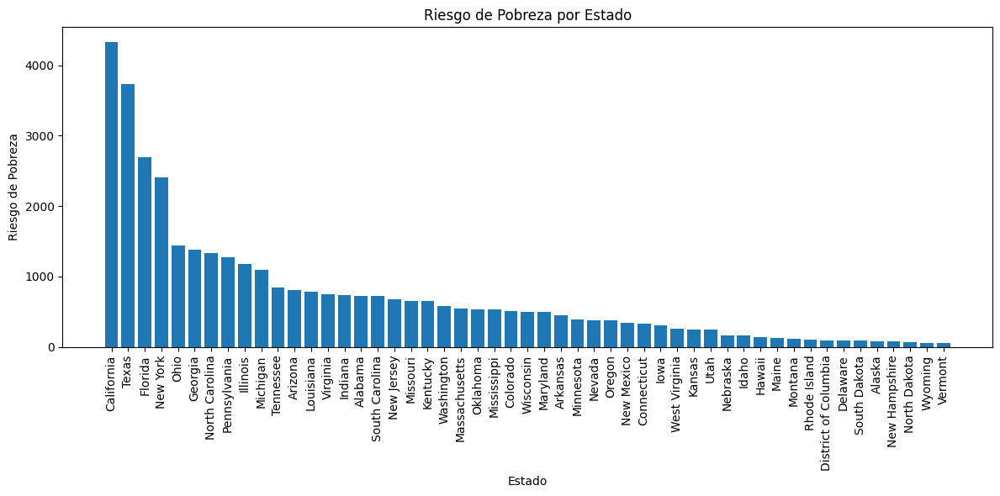

In [37]:
df_casos_por_estado = dfrp[['Unnamed: 0', 'Estimate']]

# Agrupar los datos por estado y sumar los casos positivos
casos_por_estado = df_casos_por_estado.groupby('Unnamed: 0')['Estimate'].sum()

# Ordenar los estados por la cantidad de casos positivos de forma descendente
casos_por_estado = casos_por_estado.sort_values(ascending=False)

# Graficar los casos por estado
plt.figure(figsize=(12, 6))
plt.bar(casos_por_estado.index, casos_por_estado.values)
plt.xlabel('Estado')
plt.ylabel('Riesgo de Pobreza')
plt.title('Riesgo de Pobreza por Estado')
plt.xticks(rotation=90)  # Rotar los nombres de los estados para que sean legibles
plt.tight_layout()
plt.show()

In [ ]:
Se puede observar que los tres gráficos muestran una curva similar, incluyendo el posicionamiento de algunos estados.

No tenemos datos concluyentes, pero sí indicativos de la relación entre el número de infectados y muertos por COVID-19 y las personas más vulnerables socialmente.

Obviamente, debido a la brevedad del proyecto, no pudimos profundizar en dicha investigación. 